In [1]:
# Load standard modules
import os
import numpy as np
import json
import math
import matplotlib.pyplot as plt
%matplotlib inline
from datetime import date, timedelta
import xarray as xr
import zarr

# Pytorch modules
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# cuda setup, set seed for reproducability 
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        
set_seed(41)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print(f"Using device: {device}")


# YOU NEED THIS TO LOAD PyTorch Lightning I DON"T KNOW WHY

from jupyter_client.manager import KernelManager

# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Set torch dtype to float64
torch.set_default_dtype(torch.float64)

# Set model path
import sys
sys.path.append('./src/')
import simvip_model
import data_loaders



Using device: cpu


/ext3/miniforge3/envs/swot_python12_pytorch/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/ext3/miniforge3/envs/swot_python12_pytorch/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


SyntaxError: unmatched ')' (data_loaders.py, line 104)

In [ ]:
np.gradient(np.gradient(np.array([[1, 2, 6], [3, 4, 5], [3, 4, 5]]), axis=0),axis=0)

In [ ]:
import torch
for i in range(torch.cuda.device_count()):
   print(torch.cuda.get_device_properties(i))

In [ ]:
os.cpu_count()

In [ ]:
print(torch.version.cuda)

In [ ]:
torch.get_num_threads()

In [ ]:
from importlib import reload
simvip_model = reload(simvip_model)
data_loaders = reload(data_loaders)

# Look at model losses

In [ ]:
import yaml
import pandas as pd
import glob

model_output_dirs = glob.glob("./SimVip*/lightning_logs/*")

outputs = [pd.read_csv(f"{dir}/metrics.csv") for dir in model_output_dirs if "metrics.csv" in glob.glob(f"{dir}/*")[0]]
output_labels = [dir for dir in model_output_dirs if "metrics.csv" in glob.glob(f"{dir}/*")[0]]


plt.figure(figsize=(15,5))

for i, output in enumerate(outputs[3:4]):

    plt.plot(output.step,output.train_loss,label=output_labels[3])
    plt.legend()
    #plt.plot(output[1].step,output[1].train_loss)
plt.show()

In [12]:
model_output_dirs

['./SimVip_gradloss_v1_noland/lightning_logs/version_0',
 './SimVip_gradloss_v1_noland/lightning_logs/version_1',
 './SimVip_gradloss_v1/lightning_logs/version_0',
 './SimVip_highgradloss_v1_noland/lightning_logs/version_0',
 './SimVip_gradloss_20_a01_a11_a21_lr0.0003/lightning_logs/version_0']

# Choose the model you want to evaluate here:


In [13]:
model_version = model_output_dirs[3]

# Define model

In [14]:
device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
#SimVip_model = simvip_model.SimVP_Model_no_skip_sst(in_shape=(30,2,128,128)).to(device)
device

'cpu'

# Define the dataloaders

In [15]:
len(range(30,360,5))

66

In [16]:
######################################################################################################
######################################################################################################
# Modules for loading data, set data pathimport urllib
DATASET_PATH = '/home/tm3076/scratch/pytorch_learning_tiles'
CHECKPOINT_PATH = '/home/tm3076/scratch/tm3076/pytorch_training'
DRIVE_PATH = "."

n_cpus = torch.get_num_threads()#os.cpu_count()
mid_timestep = 100
N_t = 20
#pre-computed global normalisation stats
mean_ssh = 0.074
std_ssh = 0.0986
mean_sst = 293.307
std_sst = 8.726 
#patch_coords = np.load(f'{DATASET_PATH}/np_SST_masks/x_y_coordinates.npy')
patch_coords = zarr.load(f'{DATASET_PATH}/np_SST_masks/x_y_coordinates.zarr')
batch_size = 10

multiprocessing = True


# Data loader 
full_dataset = torch.utils.data.ConcatDataset([data_loaders.llc4320_dataset(DATASET_PATH, i_mid_timestep, N_t, mean_ssh, std_ssh, mean_sst, std_sst, patch_coords, multiprocessing = multiprocessing) for i_mid_timestep in range(30,360,5)])
#full_dataset = data_loaders.llc4320_dataset(DATASET_PATH, mid_timestep, N_t, mean_ssh, std_ssh, mean_sst, std_sst, patch_coords, multiprocessing = False)
print(f"size full_dataset: {len(full_dataset)}")

# Split into train, validation, and test data
train_length = int(0.7*len(full_dataset))
validation_length = int(0.2*len(full_dataset))
test_length = len(full_dataset) - train_length - validation_length
train_dataset, validation_dataset, test_dataset = torch.utils.data.random_split(full_dataset, (train_length, validation_length, test_length))

# Verify size of datasets
print(f"size train_dataset: {len(train_dataset)}")
print(f"size validation_dataset: {len(validation_dataset)}")
print(f"size test_dataset: {len(test_dataset)}")

def worker_init_fn(worker_id):
    worker_info = torch.utils.data.get_worker_info()

train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpus, worker_init_fn = worker_init_fn, persistent_workers=True)
val_data_loader   = DataLoader(validation_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpus, worker_init_fn = worker_init_fn, persistent_workers=True)
test_data_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=n_cpus, worker_init_fn = worker_init_fn, persistent_workers=True)


size full_dataset: 25806
size train_dataset: 18064
size validation_dataset: 5161
size test_dataset: 2581


In [17]:
for step, (x, y) in enumerate(test_data_loader):
    print(step)
    break
    

0


In [18]:
print("x.shape",x.shape)
print("y.shape",y.shape)

x.shape torch.Size([10, 20, 2, 128, 128])
y.shape torch.Size([10, 20, 128, 128])


## Verify Dataloader is working as expected

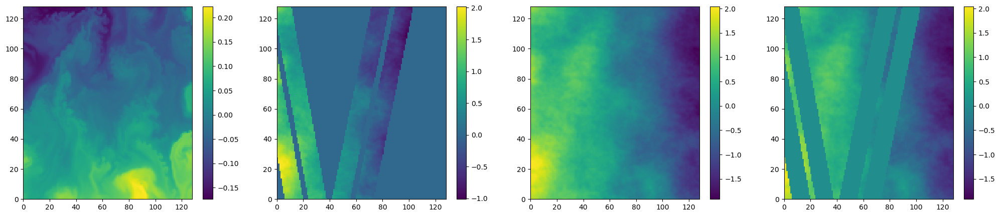

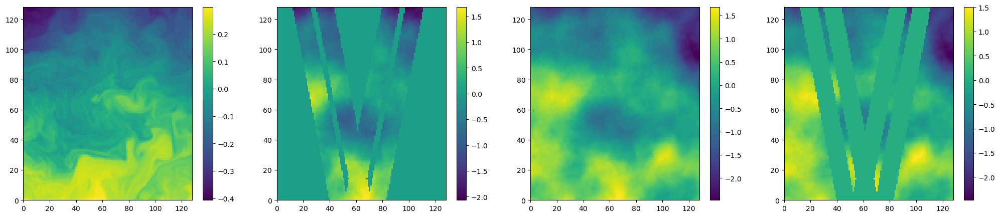

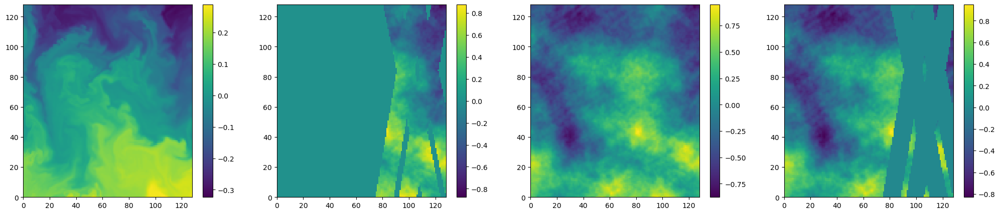

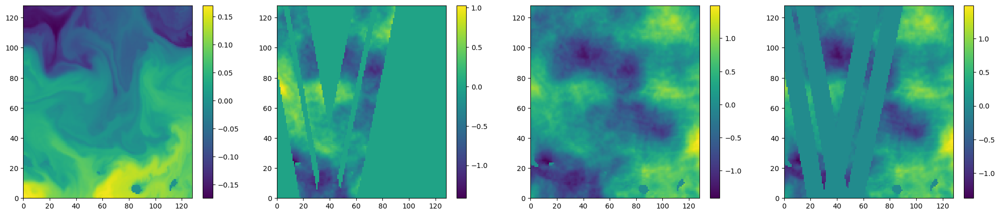

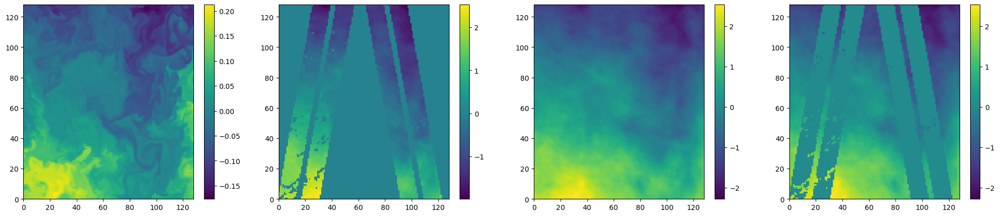

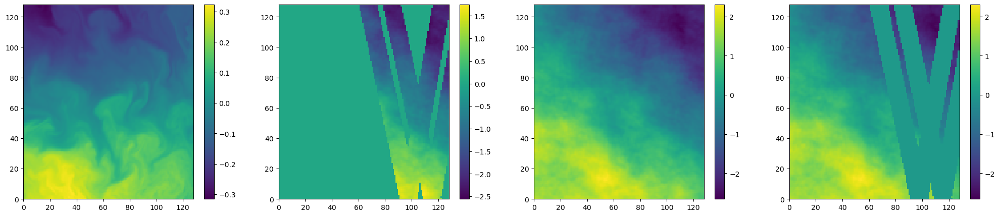

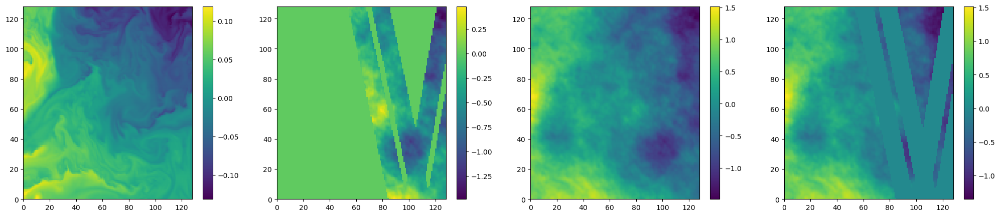

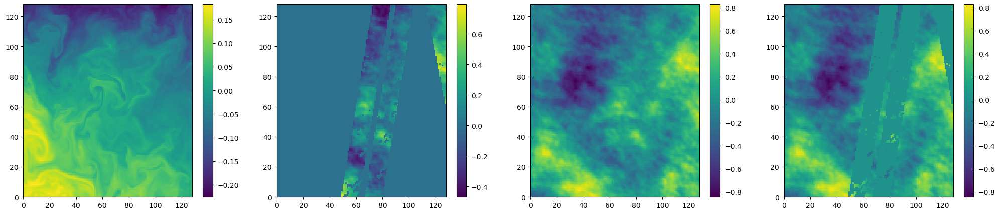

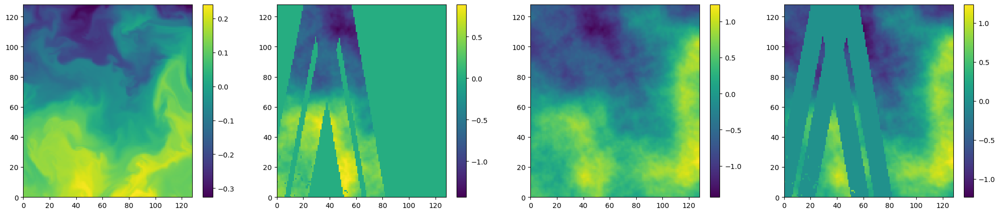

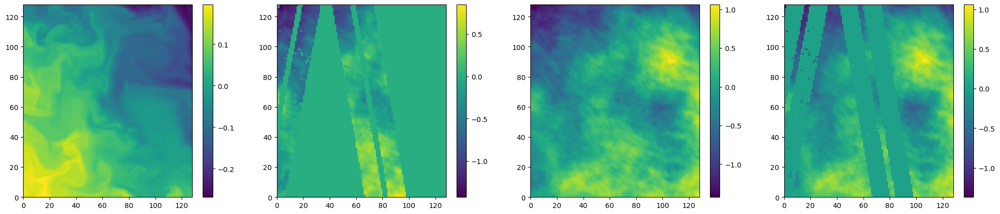

In [19]:
for i in range(len(x)):
    fig, axs = plt.subplots(1,4,figsize=(25,5))
    ims = [axs[0].pcolor(x[i,10,0,:,:]),
           axs[1].pcolor(x[i,10,1,:,:]),
           axs[2].pcolor(y[i,10,:,:]),
           axs[3].pcolor(y[i,10,:,:]-x[i,10,1,:,:]),]
    for i, im in enumerate(ims):
        fig.colorbar(im,ax=axs[i])
    plt.show()
    plt.close()
    

# SimVip Encoder

In [20]:
print(N_t)

20


In [21]:
from lightning_fabric.utilities import optimizer

class SimVip_Autoencoder(pl.LightningModule):

    def __init__(self, Number_timesteps=30, alpha1=0, alpha2=0, lr=0.0001, **model_kwargs):
        super().__init__()
        self.save_hyperparameters()
        self.forward_model = simvip_model.SimVP_Model_no_skip_sst(in_shape=(self.hparams.Number_timesteps,2,128,128),**model_kwargs)

    def forward(self, x):
        """
        x: patches
        Forward function is the SimVip encoder
        """
        y_hat = self.forward_model(x)
        return y_hat
    
    def _get_reconstruction_gradient_loss(self, batch, mode="train"):
        """
        Given a batch of images, this function returns the reconstruction loss (using MSE here)
        """
        x, y = batch
        x, y = x.double(), y.double()
        y = y[:,:,np.newaxis,:,:].to(device)
        y_hat = self.forward(x).to(device)

        y_inr_grad_i = torch.gradient(y,dim=3)
        y_inr_grad_j = torch.gradient(y,dim=4)
        y_out_grad_i = torch.gradient(y_hat,dim=3)
        y_out_grad_j = torch.gradient(y_hat,dim=4)

        y_inr_grad_ii = torch.gradient(y_inr_grad_i[0],dim=3)
        y_inr_grad_jj = torch.gradient(y_inr_grad_j[0],dim=4)
        y_out_grad_ii = torch.gradient(y_out_grad_i[0],dim=3)
        y_out_grad_jj = torch.gradient(y_out_grad_j[0],dim=4)
    
        loss = F.mse_loss(y, y_hat, reduction="none")
        loss_grad_i = F.mse_loss(y_inr_grad_i[0], y_out_grad_i[0], reduction="none")
        loss_grad_j = F.mse_loss(y_inr_grad_j[0], y_out_grad_j[0], reduction="none")
        loss_grad_ii = F.mse_loss(y_inr_grad_ii[0], y_out_grad_ii[0], reduction="none")
        loss_grad_jj = F.mse_loss(y_inr_grad_jj[0], y_out_grad_jj[0], reduction="none")
    
        # Normalize the loss by the num of pixels
        loss = loss.sum(dim=[1,2,3,4]).mean(dim=[0])
        loss_grad_i = loss_grad_i.sum(dim=[1,2,3,4]).mean(dim=[0])
        loss_grad_j = loss_grad_j.sum(dim=[1,2,3,4]).mean(dim=[0])
        loss_grad_ii = loss_grad_ii.sum(dim=[1,2,3,4]).mean(dim=[0])
        loss_grad_jj = loss_grad_jj.sum(dim=[1,2,3,4]).mean(dim=[0])

        # Alpha adjusts weight of gradient loss.
        # I picked this value based on some initial testing.
        var_weight_loss = 2e8
        var_weight_grad_i_loss = 2e6
        var_weight_grad_ii_loss = 2e6
        
        loss = var_weight_loss*loss + self.hparams.alpha1*var_weight_grad_i_loss*(loss_grad_i + loss_grad_j) + self.hparams.alpha2*var_weight_grad_ii_loss*(loss_grad_ii + loss_grad_jj)
        self.log(f'{mode}_loss', loss)
        
        return loss

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        #lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100,150], gamma=0.1)
        return optimizer#{"optimizer":optimizer, "lr_scheduler":lr_scheduler}

    def training_step(self, batch, batch_idx):
        loss = self._get_reconstruction_gradient_loss(batch, mode="train")
        return loss

    def validation_step(self, batch, batch_idx):
        self._get_reconstruction_gradient_loss(batch, mode="val")

    def test_step(self, batch, batch_idx):
        self._get_reconstruction_gradient_loss(batch, mode="test")
 



# Training function

In [22]:
def train_model(training_checkpoint_path, model_name, train_data_loader, val_data_loader, test_data_loader, **model_hparams):
    
    trainer = pl.Trainer(default_root_dir=os.path.join("/home/tm3076/scratch/pytorch_training", model_name),
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,max_epochs=180,
                         callbacks=[ModelCheckpoint(save_weights_only=True, verbose=True, save_last=True, mode="min", monitor="val_loss", every_n_train_steps=100),
                                    LearningRateMonitor("epoch")])
    
    trainer.logger._log_graph = True         # If True, we plot the computation graph in tensorboard
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need

    # Check whether pretrained model exists. If yes, load it and skip training
    print(f"training_checkpoint_path: {training_checkpoint_path}")
    pretrained_filename = os.path.join(training_checkpoint_path, "last.ckpt")
    if os.path.isfile(pretrained_filename):
        print(f"Found pretrained model at {pretrained_filename}, loading...")
        model = SimVip_Autoencoder.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
    
    elif os.path.isfile(training_checkpoint_path):
        print(f"Found checkpoint at {training_checkpoint_path}")
        model = SimVip_Autoencoder.load_from_checkpoint(training_checkpoint_path) # Load best checkpoint after training
        trainer.fit(model, train_loader, val_loader)
        model = SimVip_Autoencoder.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    else:
        print("Running from scratch")
        pl.seed_everything(42) # To be reproducable
        model = SimVip_Autoencoder(**model_hparams)
        trainer.fit(model, train_data_loader, val_data_loader)
        model = SimVip_Autoencoder.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    # Test best model on validation and test set
    val_result = trainer.test(model, val_data_loader, verbose=False)
    test_result = trainer.test(model, test_data_loader, verbose=False)
    result = {"test": test_result, "val": val_result}

    return model, result

# Load trained model here

In [23]:
######################################################################################################
######################################################################################################

CHECKPOINT_PATH = model_version
with open(model_version+'/hparams.yaml', 'r') as file:
    model_hparams = yaml.safe_load(file)
    
pretrained_filename = os.path.join(CHECKPOINT_PATH+"/checkpoints", "last.ckpt")
model = SimVip_Autoencoder.load_from_checkpoint(pretrained_filename, **model_hparams)
model.eval()



SimVip_Autoencoder(
  (forward_model): SimVP_Model_no_skip_sst(
    (enc1): Encoder_no_skip(
      (enc): Sequential(
        (0): ConvSC(
          (conv): BasicConv2d(
            (conv): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm): GroupNorm(2, 16, eps=1e-05, affine=True)
            (act): SiLU()
          )
        )
        (1): ConvSC(
          (conv): BasicConv2d(
            (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (norm): GroupNorm(2, 16, eps=1e-05, affine=True)
            (act): SiLU()
          )
        )
        (2): ConvSC(
          (conv): BasicConv2d(
            (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm): GroupNorm(2, 16, eps=1e-05, affine=True)
            (act): SiLU()
          )
        )
        (3): ConvSC(
          (conv): BasicConv2d(
            (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    

In [24]:
x_test = x.to(device)
y_eval = y.to(torch.device("cpu"))

with torch.no_grad():
    outputs = model(x_test)

In [25]:
outputs_local = outputs.to(torch.device("cpu"))

In [26]:
x_test.shape

torch.Size([10, 20, 2, 128, 128])

In [27]:
import cmocean

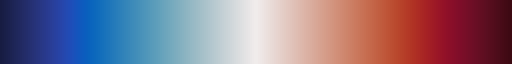

In [28]:
cmocean.cm.balance

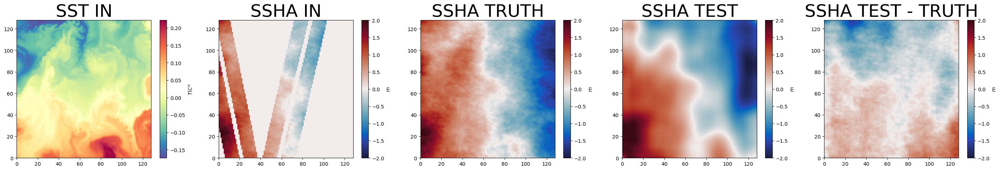

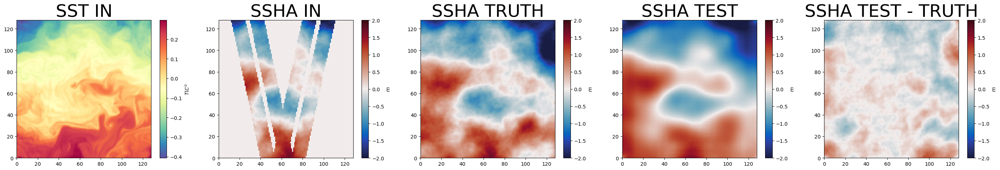

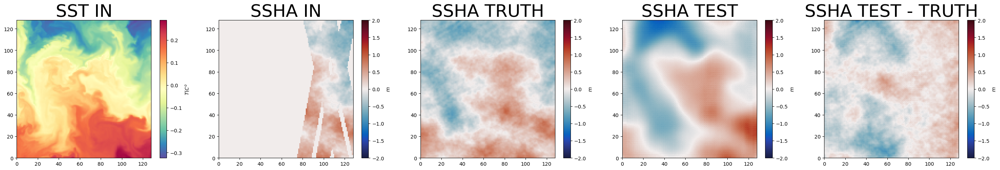

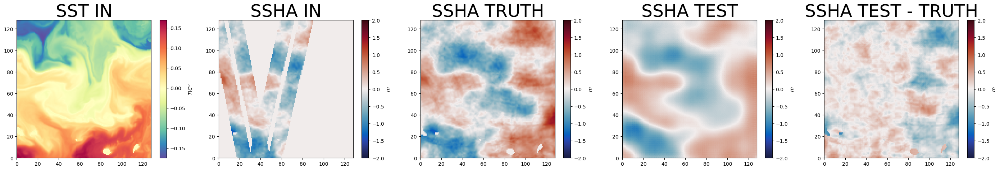

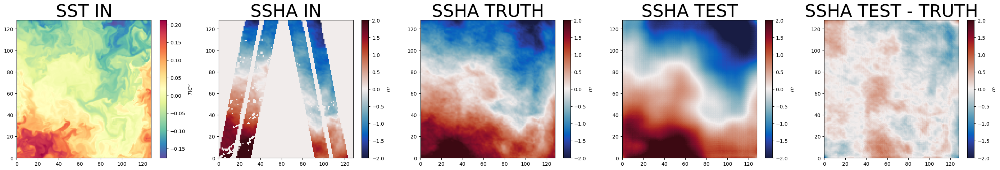

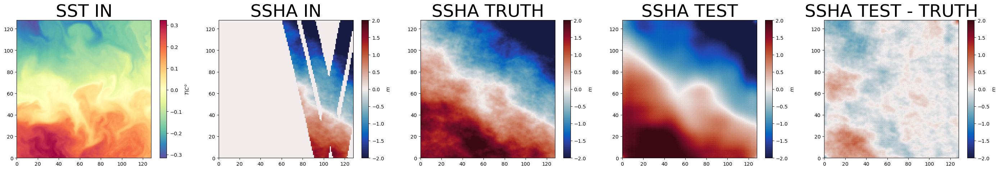

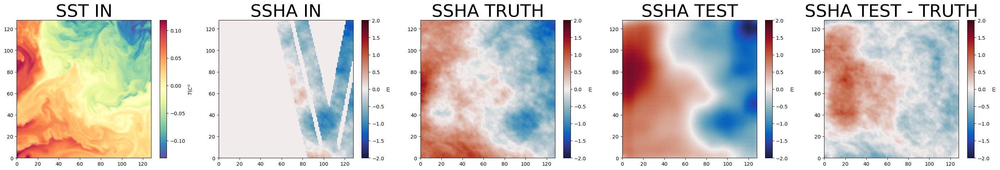

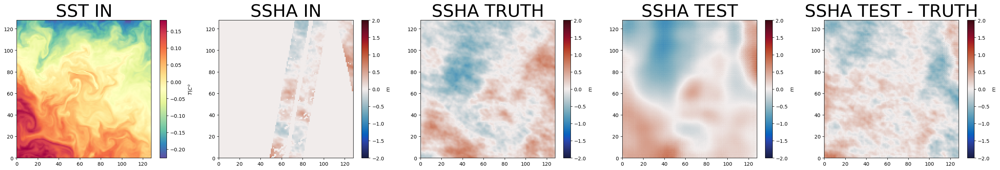

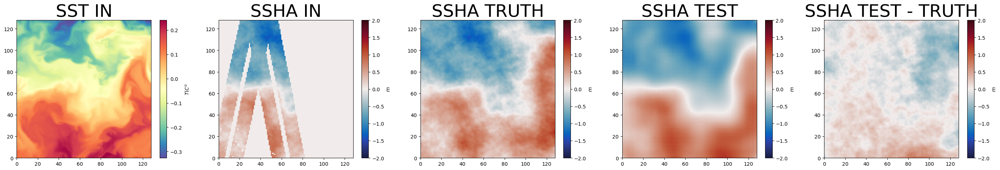

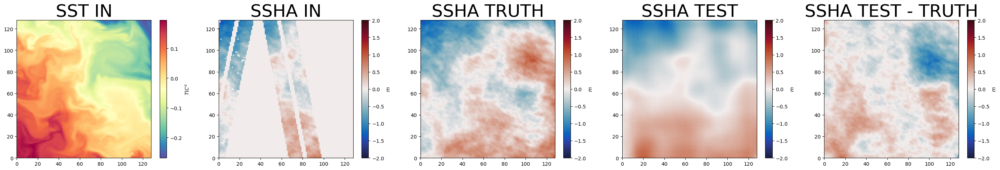

In [29]:
vmax_sst = None
vmin_sst = None

vmax_ssh = 2
vmin_ssh = -2
titles = ["SST IN", "SSHA IN", "SSHA TRUTH", "SSHA TEST", "SSHA TEST - TRUTH"]
cbar_labels = [r"$T(C^{o}$"]+ [r"$m$"]*4


for i in range(len(outputs_local)):
    fig, axs = plt.subplots(1,5,figsize=(35,5))
    ims = [axs[0].pcolor(x[i,10,0,:,:],vmin=vmin_sst,vmax=vmax_sst,cmap="Spectral_r"),
           axs[1].pcolor(x[i,10,1,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[2].pcolor(y_eval[i,10,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[3].pcolor(outputs_local[i,10,0,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[4].pcolor(outputs_local[i,10,0,:,:]-y_eval[i,10,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),]
    for i, im in enumerate(ims):
        cbar = fig.colorbar(im,ax=axs[i])
        cbar.ax.set_ylabel(cbar_labels[i])
        axs[i].set_title(titles[i],fontsize=35)

    plt.show()
    plt.close()

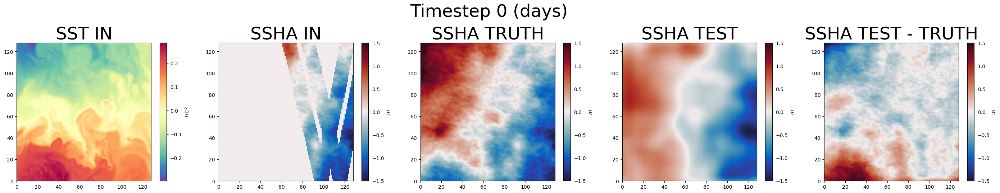

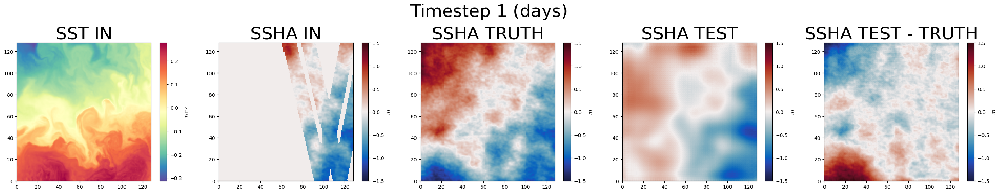

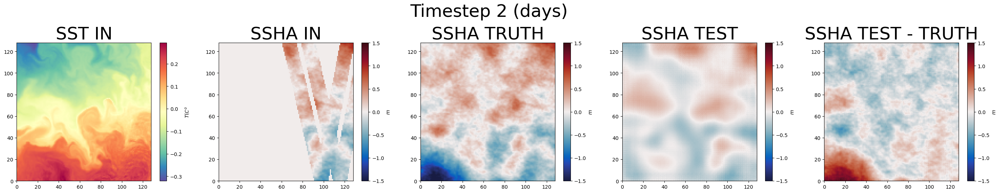

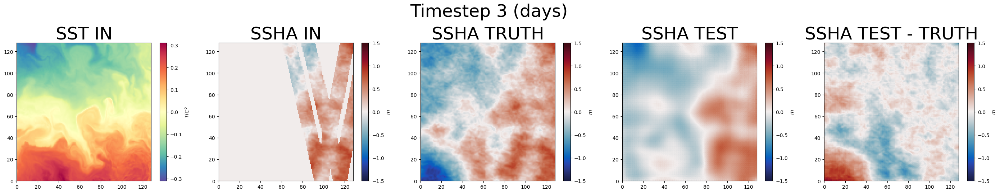

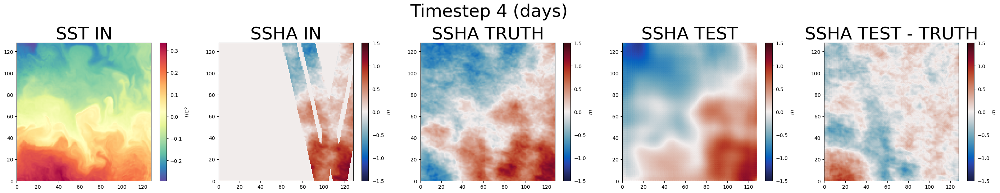

...

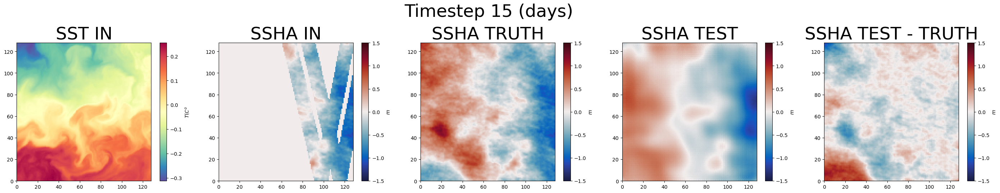

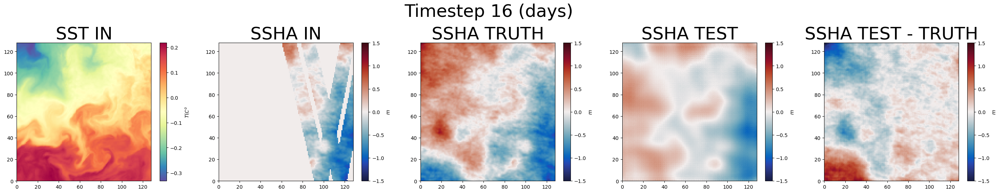

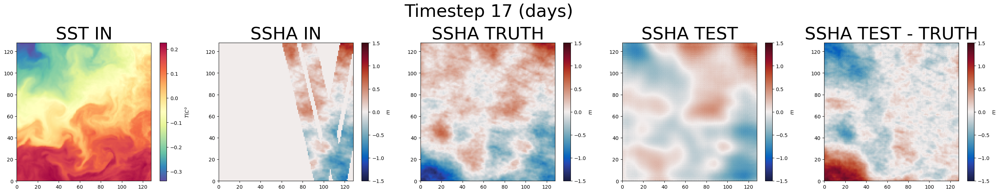

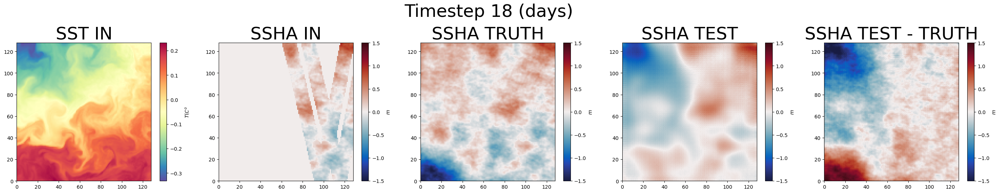

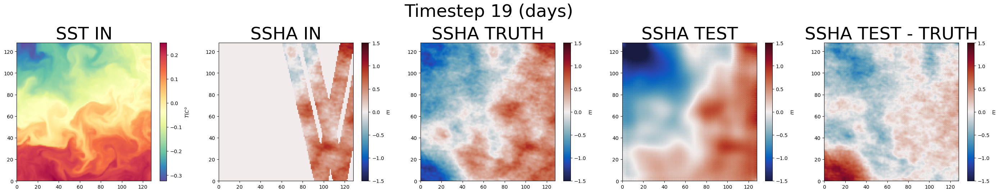

In [43]:
vmax_sst = None
vmin_sst = None

vmax_ssh = 1.5
vmin_ssh = -1.5
titles = ["SST IN", "SSHA IN", "SSHA TRUTH", "SSHA TEST", "SSHA TEST - TRUTH"]
cbar_labels = [r"$T(C^{o}$"]+ [r"$m$"]*4

tile = 5
for i in range(len(outputs_local[0])):
    fig, axs = plt.subplots(1,5,figsize=(35,5))
    ims = [axs[0].pcolor(x[tile,i,0,:,:],vmin=vmin_sst,vmax=vmax_sst,cmap="Spectral_r"),
           axs[1].pcolor(x[tile,i,1,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[2].pcolor(y_eval[tile,i,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[3].pcolor(outputs_local[tile,i,0,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[4].pcolor(outputs_local[tile,i,0,:,:]-y_eval[tile,i,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),]
    for j, im in enumerate(ims):
        cbar = fig.colorbar(im,ax=axs[j])
        cbar.ax.set_ylabel(cbar_labels[j])
        axs[j].set_title(titles[j],fontsize=35)

    plt.suptitle(f"Timestep {i} (days)",fontsize=35,y=1.1)
    #plt.savefig(f"movie_figs/simvip_raw_tile{tile}_t{(str(i).zfill(2))}.png")
    plt.show()
    plt.close()

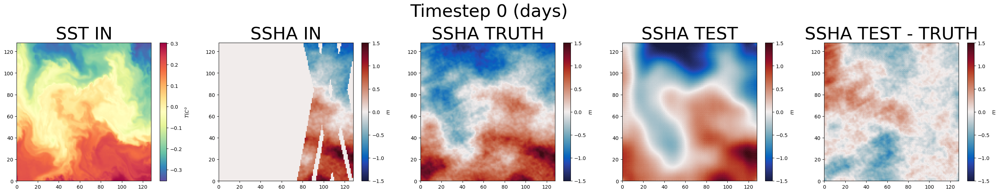

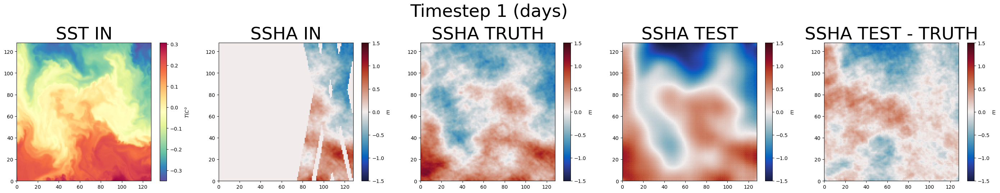

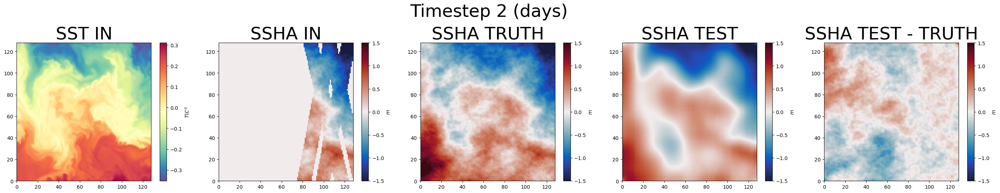

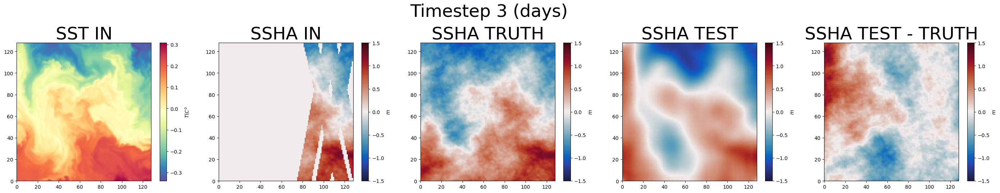

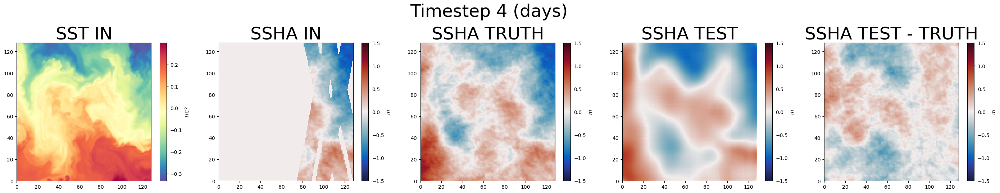

...

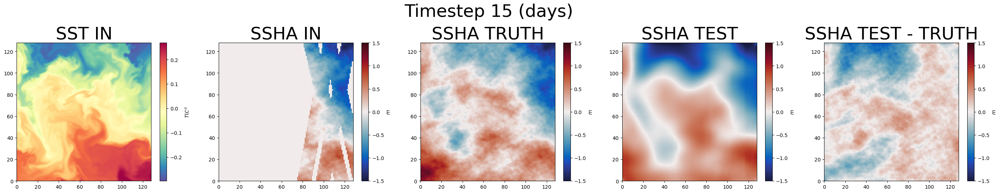

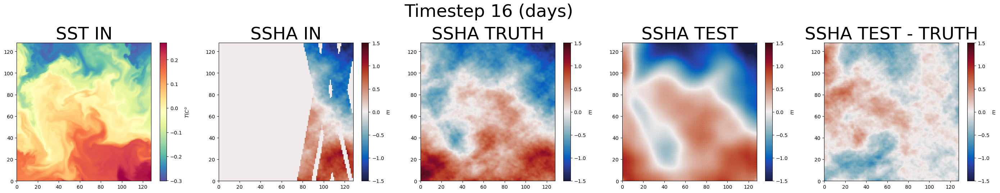

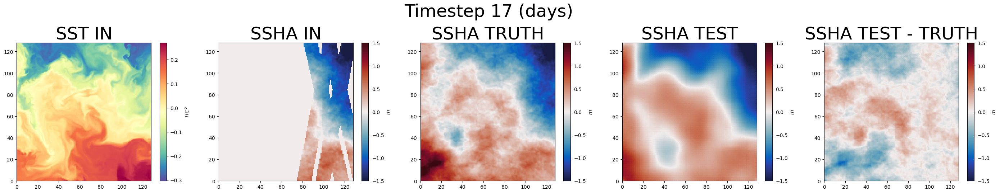

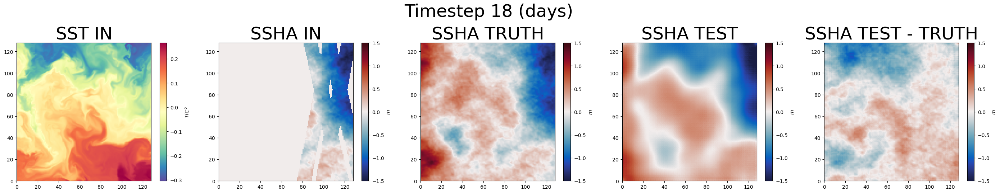

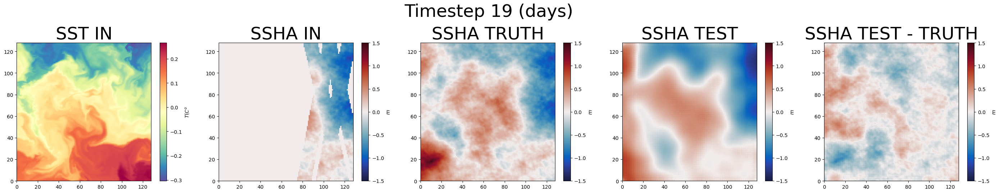

In [41]:
vmax_sst = None#0.4
vmin_sst = None #-0.4

vmax_ssh = 1.5
vmin_ssh = -1.5
titles = ["SST IN", "SSHA IN", "SSHA TRUTH", "SSHA TEST", "SSHA TEST - TRUTH"]
cbar_labels = [r"$T(C^{o}$"]+ [r"$m$"]*4

tile = 2
for i in range(len(outputs_local[0])):
    fig, axs = plt.subplots(1,5,figsize=(35,5))
    ims = [axs[0].pcolor(x[tile,i,0,:,:],vmin=vmin_sst,vmax=vmax_sst,cmap="Spectral_r"),
           axs[1].pcolor(x[tile,i,1,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[2].pcolor(y_eval[tile,i,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[3].pcolor(outputs_local[tile,i,0,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),
           axs[4].pcolor(outputs_local[tile,i,0,:,:]-y_eval[tile,i,:,:],vmin=vmin_ssh,vmax=vmax_ssh,cmap=cmocean.cm.balance),]
    for j, im in enumerate(ims):
        cbar = fig.colorbar(im,ax=axs[j])
        cbar.ax.set_ylabel(cbar_labels[j])
        axs[j].set_title(titles[j],fontsize=35)

    plt.suptitle(f"Timestep {i} (days)",fontsize=35,y=1.1)
    #plt.savefig(f"movie_figs/simvip_raw_tile{tile}_t{(str(i).zfill(2))}.png")
    plt.show()
    plt.close()

In [32]:
print(x.shape)
print(y_eval.shape)
print(outputs_local.shape)

torch.Size([10, 20, 2, 128, 128])
torch.Size([10, 20, 128, 128])
torch.Size([10, 20, 1, 128, 128])


In [33]:
def calc_loss_mse(x_in, y_in, y_out, device):
    x_in = x_in.to(device)
    y_in = y_in.to(device)
    y_out = y_out.to(device)
    
    y_inr = y_in[:,:,np.newaxis,:,:]
    
    y_inr_grad_i = torch.gradient(y_inr,dim=3)
    y_out_grad_i = torch.gradient(y_out,dim=3)
    y_inr_grad_j = torch.gradient(y_inr,dim=4)
    y_out_grad_j = torch.gradient(y_out,dim=4)

    y_inr_grad_ii = torch.gradient(y_inr_grad_i[0],dim=3)
    y_out_grad_ii = torch.gradient(y_out_grad_i[0],dim=3)
    y_inr_grad_jj = torch.gradient(y_inr_grad_j[0],dim=4)
    y_out_grad_jj = torch.gradient(y_out_grad_j[0],dim=4)

    loss = F.mse_loss(y_inr, y_out, reduction="none")
    loss_grad_i = F.mse_loss(y_inr_grad_i[0], y_out_grad_i[0], reduction="none")
    loss_grad_j = F.mse_loss(y_inr_grad_j[0], y_out_grad_j[0], reduction="none")
    loss_grad_ii = F.mse_loss(y_inr_grad_ii[0], y_out_grad_ii[0], reduction="none")
    loss_grad_jj = F.mse_loss(y_inr_grad_jj[0], y_out_grad_jj[0], reduction="none")

    # normalize the loss by the num of pixels and the timestep
    loss = loss.sum(dim=[2,3,4]).mean(dim=[0])
    loss_grad_i = loss_grad_i.sum(dim=[2,3,4]).mean(dim=[0])
    loss_grad_j = loss_grad_j.sum(dim=[2,3,4]).mean(dim=[0])
    loss_grad_ii = loss_grad_ii.sum(dim=[2,3,4]).mean(dim=[0])
    loss_grad_jj = loss_grad_jj.sum(dim=[2,3,4]).mean(dim=[0])
    
    return loss, loss_grad_i, loss_grad_j, loss_grad_ii, loss_grad_jj

In [34]:
save = False
if save:
    path = '/home/tm3076/scratch/pytorch_training/example_results'
    torch.save(x, f"{path}/test_simvip_x.pt")
    torch.save(y_eval, f"{path}/test_simvip_y_eval.pt")
    torch.save(outputs_local, f"{path}/test_simvip_outputs_local.pt")

In [35]:
loss, loss_grad_i, loss_grad_j, loss_grad_ii, loss_grad_jj = calc_loss_mse(x,y_eval,outputs_local,device)
#y_inr_grad_i = calc_loss_mse(x,y_eval,outputs_local,device)

In [36]:
1/torch.var(y_eval[:,:,np.newaxis,:,:])**2

tensor(2.7050)

In [37]:
y_inr_grad_i = torch.gradient(y_eval[:,:,np.newaxis,:,:],dim=3)
y_inr_grad_j = torch.gradient(y_eval[:,:,np.newaxis,:,:],dim=4)
print(0.01/torch.var(y_inr_grad_i[0])**2)
print(0.01/torch.var(y_inr_grad_j[0])**2)

tensor(2154.1802)
tensor(3311.9473)


In [38]:
y_inr_grad_jj = torch.gradient(y_inr_grad_i[0],dim=4)
y_inr_grad_ii = torch.gradient(y_inr_grad_i[0],dim=3)
print(1/torch.var(y_inr_grad_jj[0]))
print(1/torch.var(y_inr_grad_ii[0]))

tensor(2960.6796)
tensor(1399.1297)


In [39]:
loss = F.mse_loss(y_eval[:,:,np.newaxis,:,:], outputs_local, reduction="none")